<a href="https://colab.research.google.com/github/niconielsen32/ObjectTracking/blob/main/ObjectTracking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

El objetivo de este proyecto es realizar el seguimiento de personas en un video utilizando un filtro de Kalman y un modelo pre-entrenado de aprendizaje profundo. Este modelo procesa cada cuadro del video y devuelve una lista de 4 coordenadas que definen un cuadro delimitador alrededor de cada persona detectada en la imagen. Estas coordenadas corresponden a la posición de las esquinas del cuadro delimitador en píxeles, y se utilizan para localizar y seguir a cada persona a medida que se mueven a lo largo del video. 
El proceso de seguimiento requiere de asignar un ID único a cada persona detectada y registrar su posición en cada cuadro del video, lo que permite rastrear su movimiento y analizar su comportamiento a lo largo del tiempo.

# Requerimientos

## Paso 1: 
Obten el detector de objetos que vamos a utilizar. Puedes utilizar cualquier otro detector de objetos para obtener el cuadro delimitador y pasarlo al algoritmo de Solar que en realidad utiliza un filtro de Kalman para rastrear esos cuadros delimitadores en el entorno.

In [1]:
!pip install tf-centernet

  Using cached tf_centernet-1.0.6-py3-none-any.whl (19 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 980.5/980.5 kB 2.3 MB/s eta 0:00:00a 0:00:01
  Using cached libclang-16.0.0-py2.py3-none-macosx_10_9_x86_64.whl (26.7 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 2.3 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.1
    Uninstalling protobuf-3.20.1:
      Successfully uninstalled protobuf-3.20.1


## Opcional:
Si aún no conlas el repositorio base de este trabajo, usa:

In [2]:
!git clone https://github.com/niconielsen32/ObjectTracking.git

Cloning into 'ObjectTracking'...
remote: Enumerating objects: 43, done.
remote: Counting objects: 100% (43/43), done.
remote: Compressing objects: 100% (20/20), done.
remote: Total 43 (delta 1), reused 2 (delta 0), pack-reused 0
Receiving objects: 100% (43/43), 10.84 MiB | 1.98 MiB/s, done.
Resolving deltas: 100% (1/1), done.


In [4]:
!pip install -r ../requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.0/178.0 kB 2.1 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 3.9 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.9/840.9 kB 2.2 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for filterpy: filename=filterpy-1.4.5-py3-none-any.whl size=110459 sha256=ccf61fbe605652a1641334d350453abacc57b78180143c747d1b15cdb4d3ec6a
  Stored in directory: /Users/brandon/Library/Caches/pip/wheels/a5/35/aa/26bde30d4eb680f9a46e43bb9fdcf18dc940a0cbfd1589c4eb
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [587 lines of output]
      Partial import of lap during the build process.
      Generating cython files
      running bdist_wheel
      running build
      running config_cc
      INFO: unifing config_cc, co

Si revisas el archivo `requirements.txt`, verás que necesitamos la biblioteca `filterpy`. Usaremos dicha biblioteca para implementar el filtro de Kalman y así dar seguimiento de los objetos detectados por el modelo de DL de un cuadro a otro.

El script `sort.py` se encarga de realizarel _trackeo_. Parte fundamental del proyecto será entender como se implementó el filtro.

# Object Tracking with SORT

In [76]:
import sys
import os
import centernet


sys.path.append('../')

from src.sort import Sort
from src.lib import VisTrack, show_video, create_video

import numpy as np
import PIL.Image
import cv2
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import shutil
import imageio

## Upload the video you want to work with

In [31]:
!wget https://viratdata.org/video/VIRAT_S_010204_05_000856_000890.mp4 -O video.mp4
video_file = "video.mp4"
show_video(video_file)

--2023-05-16 18:30:57--  https://viratdata.org/video/VIRAT_S_010204_05_000856_000890.mp4
Resolving viratdata.org (viratdata.org)... 185.199.108.153, 185.199.110.153, 185.199.111.153, ...
Connecting to viratdata.org (viratdata.org)|185.199.108.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5248590 (5.0M) [application/mp4]
Saving to: 'video.mp4'

video.mp4           100%[===================>]   5.00M  1.09MB/s    in 4.7s    

2023-05-16 18:31:02 (1.06 MB/s) - 'video.mp4' saved [5248590/5248590]



In [33]:
# getting the total number of frames
# !conda install -c conda-forge imageio-ffmpeg
cap = imageio.get_reader(video_file, 'ffmpeg')
num_frames = cap.count_frames()
num_frames

584

In [34]:
vt = VisTrack()

# Create an object detector

# Default: num_classes=80. This represents the number of classes we want to detect in ur image
obj = centernet.ObjectDetection(num_classes=80)

# num_classes=80 and weights_path=None: Pre-trained COCO model will be loaded. (i.e its weights)
obj.load_weights(weights_path=None)

2023-05-16 18:38:52.331098: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


766861424/766861424 [==============================] - 657s 1us/step


## Example image

Before we use our object detector, we test it with an image

--2023-05-16 18:50:26--  https://images.squarespace-cdn.com/content/v1/57aa455937c581cbe1aba790/1478015230831-I9TWP5BJX54APXMNPJ7W/ke17ZwdGBToddI8pDm48kBZw6jF4_OvU-ddo_vwqGhp7gQa3H78H3Y0txjaiv_0fDoOvxcdMmMKkDsyUqMSsMWxHk725yiiHCCLfrh8O1z5QPOohDIaIeljMHgDF5CVlOqpeNLcJ80NK65_fV7S1Ub61YCrK70I7JIpWiI8ho4Yi1WvVNQtDE81xuRbL1MFKm0sD-Bab7E9MY8W31A7zMQ/image-asset.jpeg
Resolving images.squarespace-cdn.com (images.squarespace-cdn.com)... 199.232.8.238
Connecting to images.squarespace-cdn.com (images.squarespace-cdn.com)|199.232.8.238|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 371299 (363K) [image/jpeg]
Saving to: 'img.jpeg'

img.jpeg            100%[===================>] 362.60K  1.16MB/s    in 0.3s    

2023-05-16 18:50:30 (1.16 MB/s) - 'img.jpeg' saved [371299/371299]



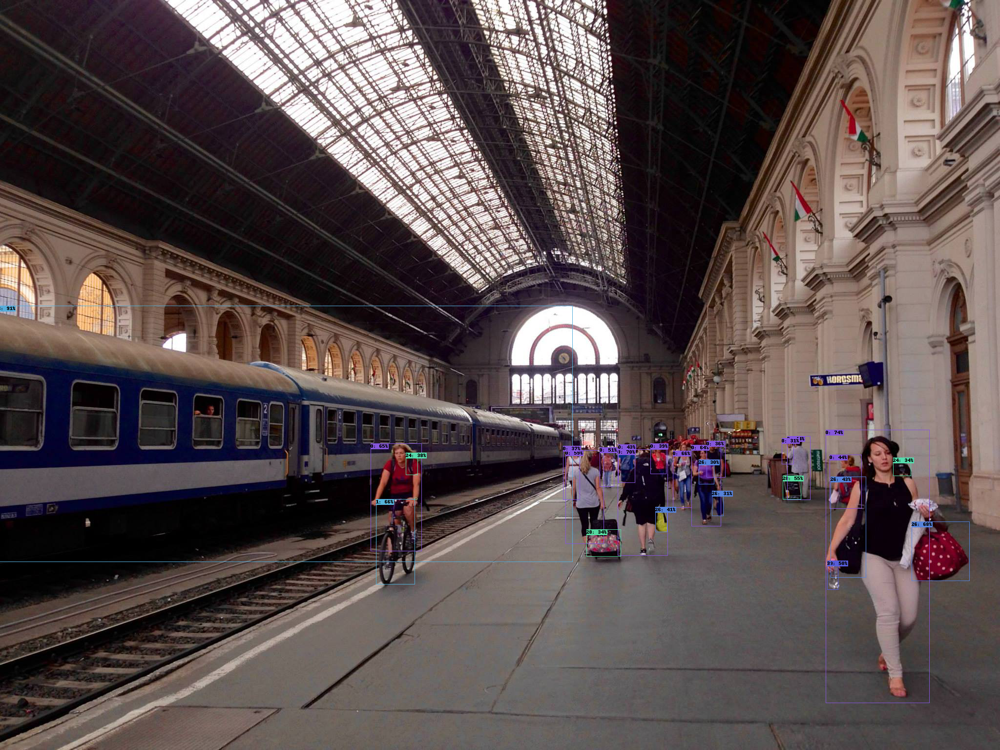

In [35]:
!wget https://images.squarespace-cdn.com/content/v1/57aa455937c581cbe1aba790/1478015230831-I9TWP5BJX54APXMNPJ7W/ke17ZwdGBToddI8pDm48kBZw6jF4_OvU-ddo_vwqGhp7gQa3H78H3Y0txjaiv_0fDoOvxcdMmMKkDsyUqMSsMWxHk725yiiHCCLfrh8O1z5QPOohDIaIeljMHgDF5CVlOqpeNLcJ80NK65_fV7S1Ub61YCrK70I7JIpWiI8ho4Yi1WvVNQtDE81xuRbL1MFKm0sD-Bab7E9MY8W31A7zMQ/image-asset.jpeg -O img.jpeg 

# get an image
p_img = PIL.Image.open('img.jpeg')
img = cv2.cvtColor(np.array(p_img), cv2.COLOR_BGR2RGB)

boxes, classes, scores = obj.predict(img)

vt.draw_bounding_boxes(p_img, boxes, classes, scores)

## Predict on the video

In [42]:
vidcap = cv2.VideoCapture(video_file)

# getting frame count
frame_count = vidcap.get(cv2.CAP_PROP_FRAME_COUNT)

frame_count

[ WARN:0@2946.942] global /private/var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_5a1v4y7k9y/croot/opencv-suite_1676472757237/work/modules/videoio/src/cap_gstreamer.cpp (862) isPipelinePlaying OpenCV | GStreamer warning: GStreamer: pipeline have not been created
[ERROR:0@2946.942] global /private/var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_5a1v4y7k9y/croot/opencv-suite_1676472757237/work/modules/videoio/src/cap.cpp (166) open VIDEOIO(GSTREAMER): raised OpenCV exception:

OpenCV(4.6.0) /private/var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_5a1v4y7k9y/croot/opencv-suite_1676472757237/work/modules/core/src/utils/filesystem.cpp:580: error: (-213:The function/feature is not implemented)  in function 'exists'




584.0

In [43]:
# frames per second
fps = vidcap.get(cv2.CAP_PROP_FPS)
fps

23.969999313354492

In [45]:
# use opencv and pass our video
vidcap = cv2.VideoCapture(video_file)

# get all individual frames or images of our video
fps = vidcap.get(cv2.CAP_PROP_FPS)

#get the length of the video
length = int(vidcap.get(cv2.CAP_PROP_FRAME_COUNT))

# output folder to save the output video with all the objects tracked in its box
folder_out = "Track"
if os.path.exists(folder_out):
    shutil.rmtree(folder_out)
os.makedirs(folder_out)

draw_imgs = []
# if the probability of detect and object is <0.3, then do not detect it
# max frames allowed to miss the object
sort = Sort(max_age=1, min_hits=3, iou_threshold=0.3)

# progress bar
pbar = tqdm(total=length)
i = 0
# a while loop running though all the frames that we have in our actually video
while True:
    #read indivudual frames from the video and save in the frame variable:
    ret, frame = vidcap.read()
    if not ret:
# finish until we are not getting any frames
        break

# pass every frame to our model and for it, get the bounding boxes, classes and scores(probabilities)
    boxes, classes, scores = obj.predict(frame)
# get the length of our bounding boxes, i.e the number of detections in our frame
    detections_in_frame = len(boxes)
    if detections_in_frame:
        # get only the indexes for person detection
        # centernet will do detection on all the COCO classes. "person" is class number 0 
        idxs = np.where(classes == 0)[0] # vector of 1's and 0's
        boxes = boxes[idxs] # filtering by the class desired
        scores = scores[idxs] # filtering by the class desired
        classes = classes[idxs] # filtering by the class desired
    else:
        boxes = np.empty((0, 5))

     # make an horizontal stack of boxes and scores, i.e the results of all the detections of all the frames
    dets = np.hstack((boxes, scores[:,np.newaxis]))
    # use kalman filter to update the detections
    # what does update? : Updates the state vector with observed bounding box(bbox).
    res = sort.update(dets)

    # from the results we can get the boxes that we tracked
    boxes_track = res[:,:-1]
    # and also the ids
    boces_ids = res[:,-1].astype(int)

    # create a video using all those images that pass though
    p_frame = PIL.Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    # if we have detections, draw bounding boxes
    if detections_in_frame:
        p_frame = vt.draw_bounding_boxes(p_frame, boxes_track, boces_ids, scores)
    p_frame.save(os.path.join(folder_out, f"{i:03d}.png"))

    i+=1
    pbar.update(1)

[ WARN:0@3703.047] global /private/var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_5a1v4y7k9y/croot/opencv-suite_1676472757237/work/modules/videoio/src/cap_gstreamer.cpp (862) isPipelinePlaying OpenCV | GStreamer warning: GStreamer: pipeline have not been created
[ERROR:0@3703.047] global /private/var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_5a1v4y7k9y/croot/opencv-suite_1676472757237/work/modules/videoio/src/cap.cpp (166) open VIDEOIO(GSTREAMER): raised OpenCV exception:

OpenCV(4.6.0) /private/var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_5a1v4y7k9y/croot/opencv-suite_1676472757237/work/modules/core/src/utils/filesystem.cpp:580: error: (-213:The function/feature is not implemented)  in function 'exists'




  0%|          | 0/584 [00:00<?, ?it/s]

## Show and download the tracking

In [46]:
track_video_file = 'tracking.mp4'
create_video(frames_patten='Track/%03d.png', video_file = track_video_file, framerate=fps)

ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with clang version 4.0.1 (tags/RELEASE_401/final)
  configuration: --prefix=/opt/concourse/worker/volumes/live/d5b9ea1c-8223-4ff6-7416-83e6b4cd6874/volume/ffmpeg_1587154914508/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehol --cc=x86_64-apple-darwin13.4.0-clang --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilt

In [47]:
#files.download(track_video_file)

In [66]:
%pwd

'/Users/brandon/Documents/MCD/2do_semestre/kalmaning-object-tracking/notebooks'

In [74]:
show_video("../videos/tracking_incertidumbre.mp4")

In [79]:
%pwd

'/Users/brandon/Documents/MCD/2do_semestre/kalmaning-object-tracking/notebooks'

In [80]:
show_video("/Users/brandon/Documents/MCD/2do_semestre/kalmaning-object-tracking/videos/tracking_new.mp4")

In [49]:
from filterpy.kalman import KalmanFilter

kf = KalmanFilter(dim_x=7, dim_z=4)

In [52]:
kf.R

array([[1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [0., 0., 0., 1.]])

In [57]:
kf.P

array([[1., 0., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 1.]])

In [59]:
kf.Q[-1,-1] *= 0.01
kf.Q[4:,4:] *= 0.01

kf.Q

array([[1.e+00, 0.e+00, 0.e+00, 0.e+00, 0.e+00, 0.e+00, 0.e+00],
       [0.e+00, 1.e+00, 0.e+00, 0.e+00, 0.e+00, 0.e+00, 0.e+00],
       [0.e+00, 0.e+00, 1.e+00, 0.e+00, 0.e+00, 0.e+00, 0.e+00],
       [0.e+00, 0.e+00, 0.e+00, 1.e+00, 0.e+00, 0.e+00, 0.e+00],
       [0.e+00, 0.e+00, 0.e+00, 0.e+00, 1.e-02, 0.e+00, 0.e+00],
       [0.e+00, 0.e+00, 0.e+00, 0.e+00, 0.e+00, 1.e-02, 0.e+00],
       [0.e+00, 0.e+00, 0.e+00, 0.e+00, 0.e+00, 0.e+00, 1.e-04]])

In [60]:
kf.x

array([[0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.]])

In [64]:
p_frame.size

(1280, 720)